## Start compute simliarity between two strings

In [1]:
import os
import sys

project_root = os.path.abspath(os.path.join(os.path.dirname("__file__"), ".."))
sys.path.append(project_root)
os.environ["TOKENIZERS_PARALLELISM"] = "false"


In [2]:
from src.dataset.coupert import CoupertDataset
from src.arguments import DataArguments
from utils.reranker import Reranker
from utils.metrics import compute_recall
from utils.visualize import visualize
from transformers import AutoTokenizer, AutoModel
import torch
from tqdm import tqdm
import numpy as np
import pandas as pd
from safetensors.torch import save_file, load_file
import logging

# 获取 vllm 日志记录器
vllm_logger = logging.getLogger("vllm")

# 设置日志等级，例如设置为 WARNING
vllm_logger.setLevel(logging.WARNING)

model_dir = "../model/BAAI/bge-large-en-v1.5"
embedding_path = os.path.join(
    "../embeddings/", model_dir.split("/")[-1] + ".safetensors"
)
reranker_model_path = "/home/hutu/workspace/qwen_server/model/qwen2-vl-7B-Instruct-AWQ"
data_dir = "../data/coupert"
device = "cuda"


/home/hutu/miniconda3/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/hutu/miniconda3/lib/python3.12/site-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.0 (you have 1.4.24). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
2025-01-17 14:14:52,831	INFO util.py:154 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


In [3]:
reranker = Reranker(
    model_path=reranker_model_path,
    tensor_parallel_size=2,
    max_model_len=8000,
)

WARNING 01-17 14:15:04 config.py:428] awq quantization is not fully optimized yet. The speed can be slower than non-quantized models.
WARNING 01-17 14:15:04 config.py:503] To see benefits of async output processing, enable CUDA graph. Since, enforce-eager is enabled, async output processor cannot be used
WARNING 01-17 14:15:05 multiproc_gpu_executor.py:56] Reducing Torch parallelism from 44 threads to 1 to avoid unnecessary CPU contention. Set OMP_NUM_THREADS in the external environment to tune this value as needed.
WARNING 01-17 14:15:11 custom_all_reduce.py:143] Custom allreduce is disabled because your platform lacks GPU P2P capability or P2P test failed. To silence this warning, specify disable_custom_all_reduce=True explicitly.
(VllmWorkerProcess pid=3361418) WARNING 01-17 14:15:11 custom_all_reduce.py:143] Custom allreduce is disabled because your platform lacks GPU P2P capability or P2P test failed. To silence this warning, specify disable_custom_all_reduce=True explicitly.


Loading safetensors checkpoint shards:   0% Completed | 0/2 [00:00<?, ?it/s]
Loading safetensors checkpoint shards:  50% Completed | 1/2 [00:01<00:01,  1.03s/it]
Loading safetensors checkpoint shards: 100% Completed | 2/2 [00:01<00:00,  1.25it/s]
Loading safetensors checkpoint shards: 100% Completed | 2/2 [00:01<00:00,  1.20it/s]



In [4]:
embs = load_file(embedding_path)
eval_embs = embs["eval_embs"]
gallery_embs = embs["gallery_embs"]

In [5]:
eval_df = pd.read_json("../data/coupert/coupert_eval_retrieval.jsonl", lines=True)
gallery_df = pd.read_json("../data/coupert/coupert_gallery.jsonl", lines=True)


============================================================ 0 ============================================================
labels:


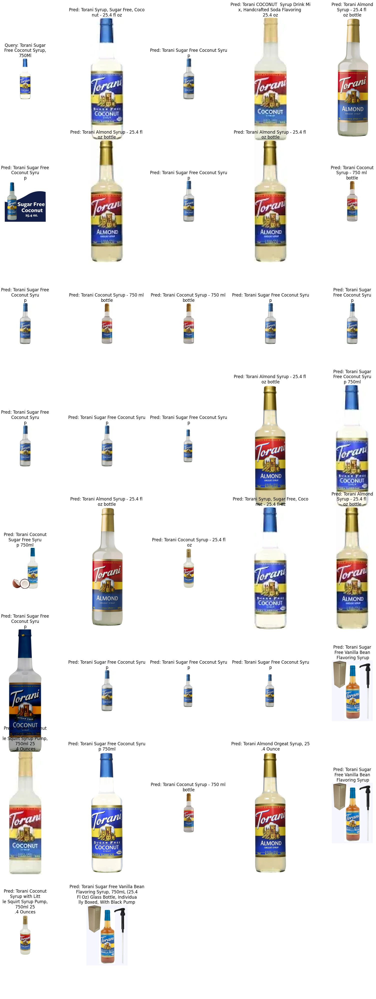

preds:


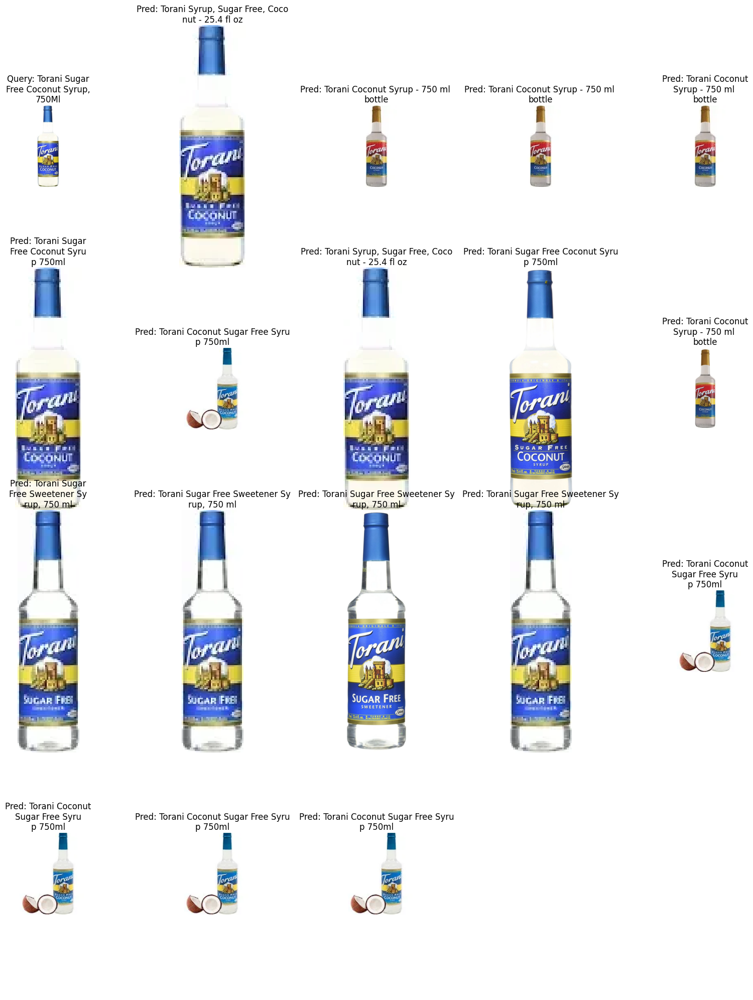

============================================================ 1 ============================================================
labels:


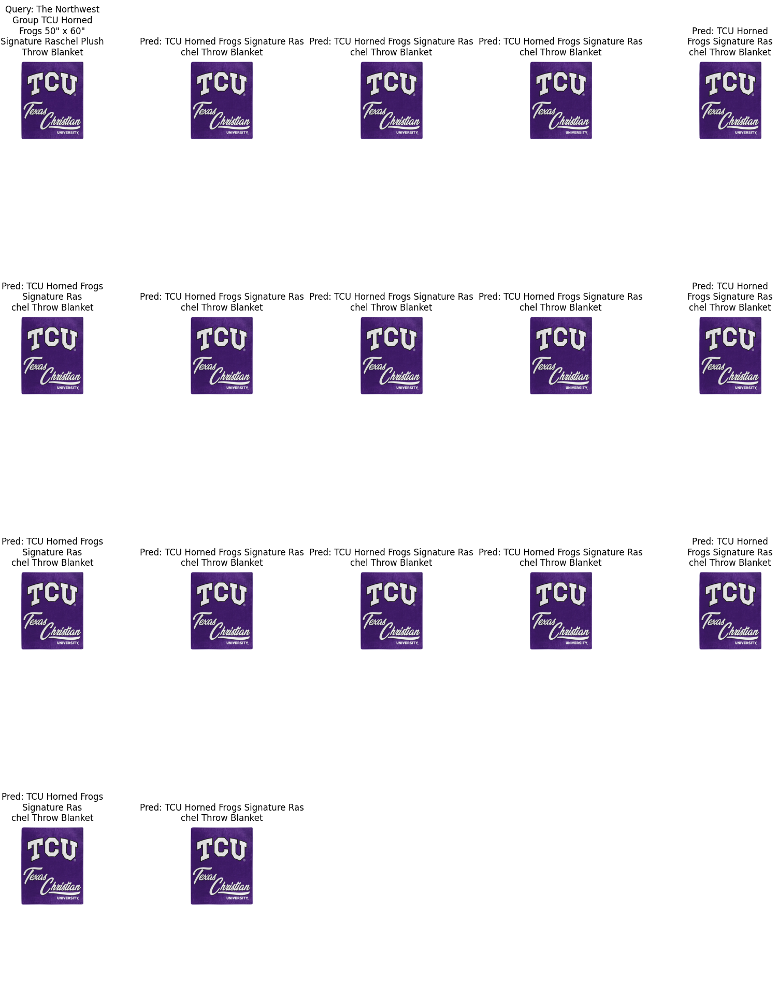

preds:


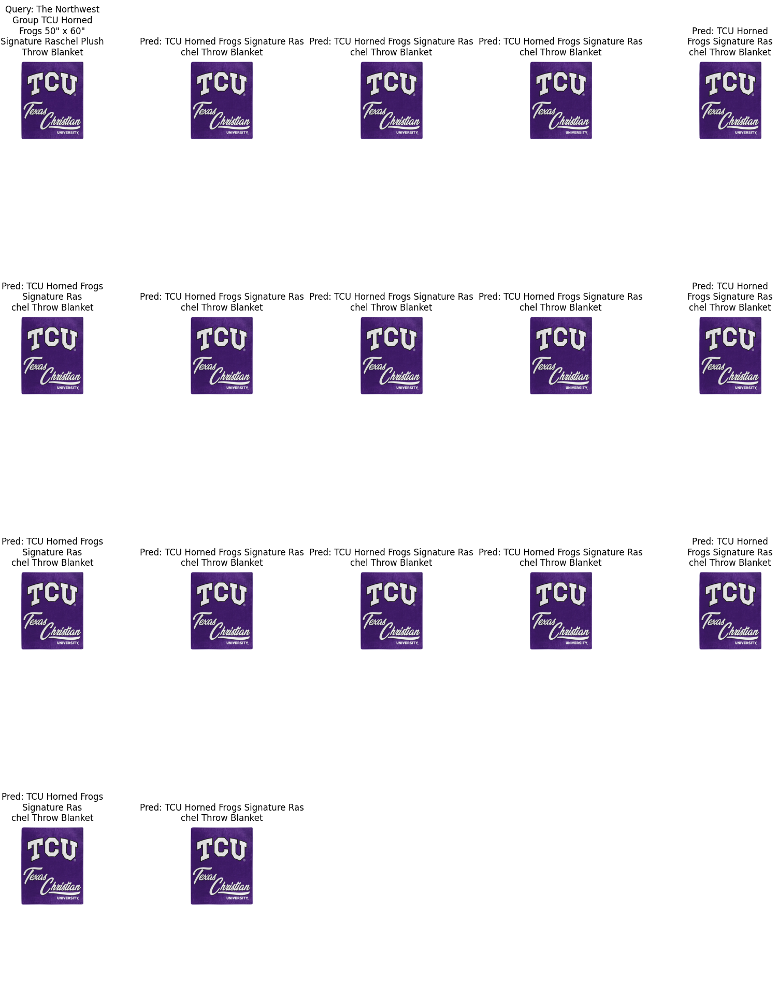

============================================================ 2 ============================================================
labels:


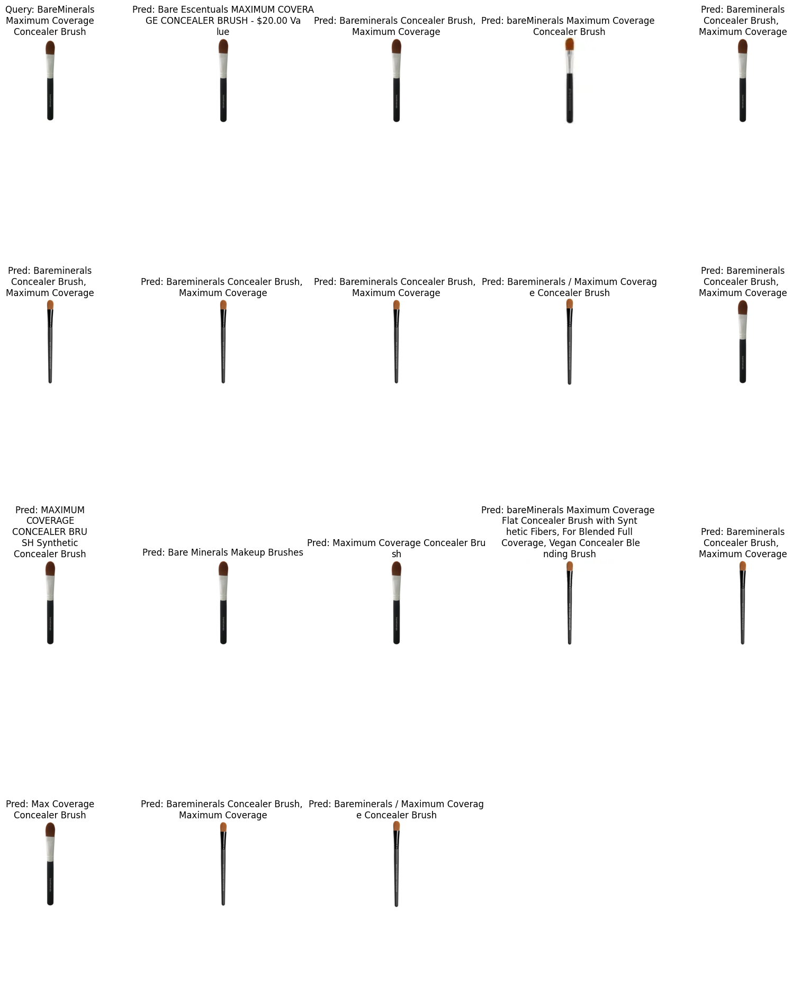

preds:


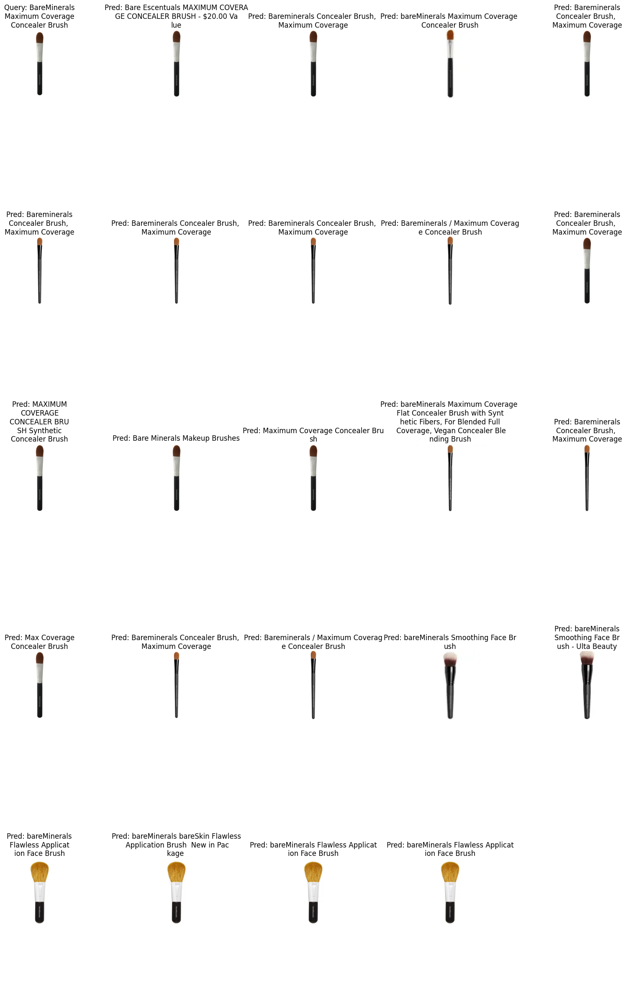

============================================================ 3 ============================================================
labels:


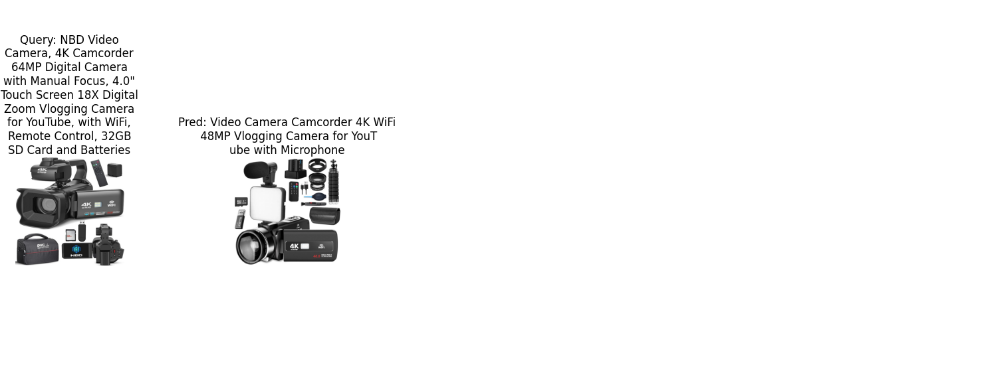

preds:


/ssd2/hutu_data/MMRetrieval/utils/visualize.py:44: UserWarning: Glyph 128 (\x80) missing from font(s) DejaVu Sans.
  plt.tight_layout(pad=1.0)  # Increase padding between plots
/ssd2/hutu_data/MMRetrieval/utils/visualize.py:44: UserWarning: Glyph 157 (\x9d) missing from font(s) DejaVu Sans.
  plt.tight_layout(pad=1.0)  # Increase padding between plots
/home/hutu/miniconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128 (\x80) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/hutu/miniconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 157 (\x9d) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


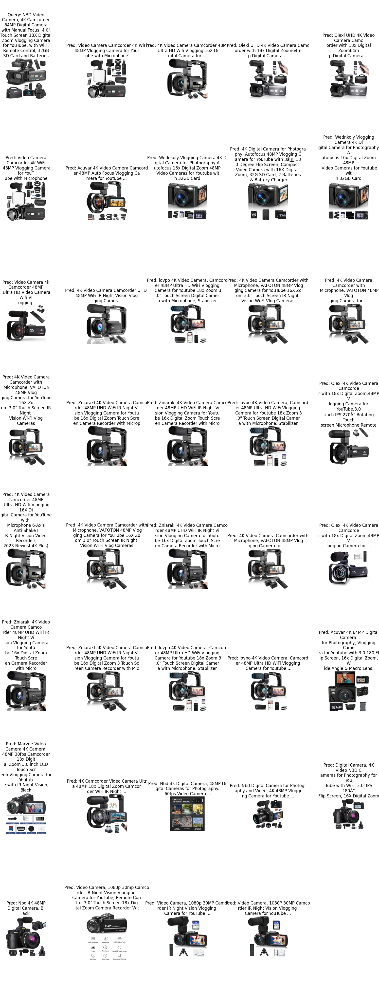

============================================================ 4 ============================================================
labels:


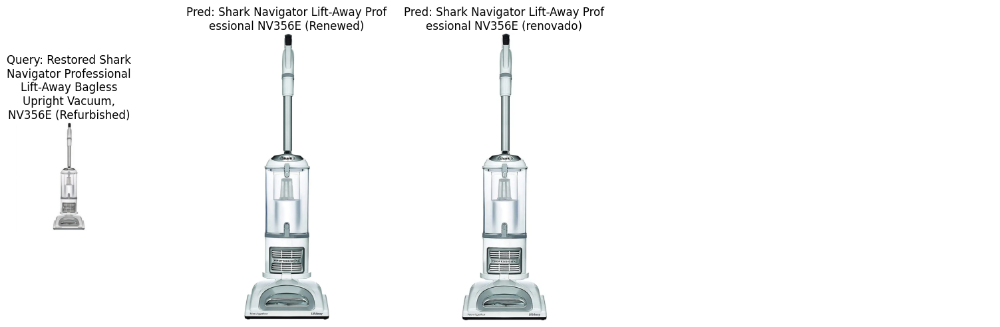

preds:


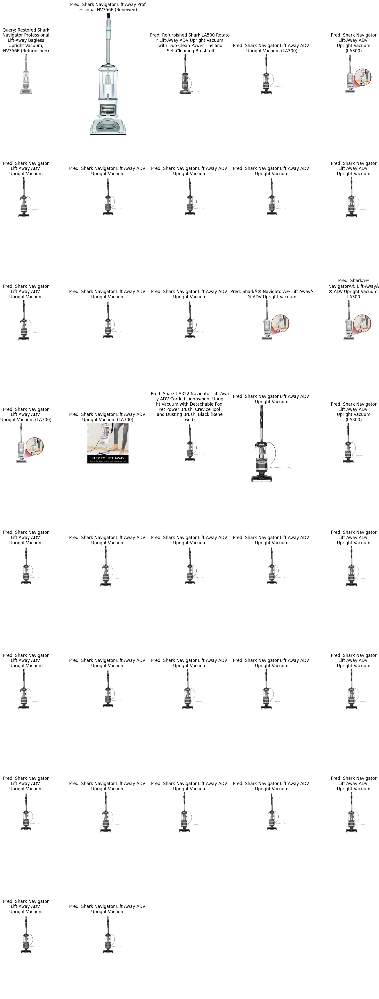

============================================================ 5 ============================================================
labels:


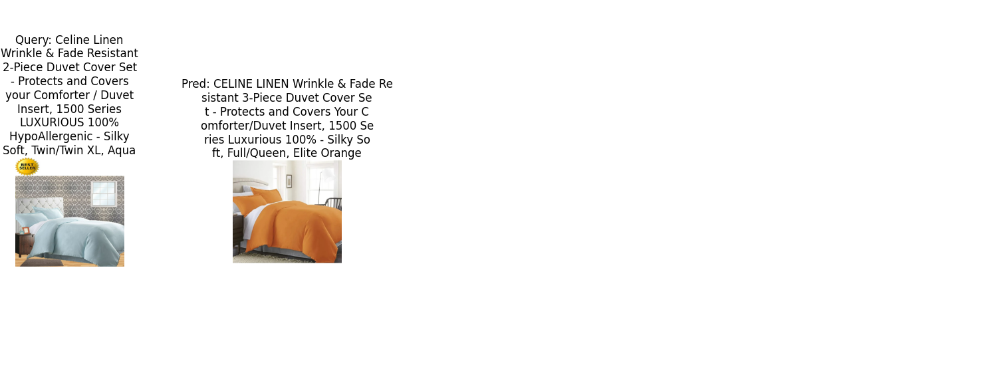

preds:


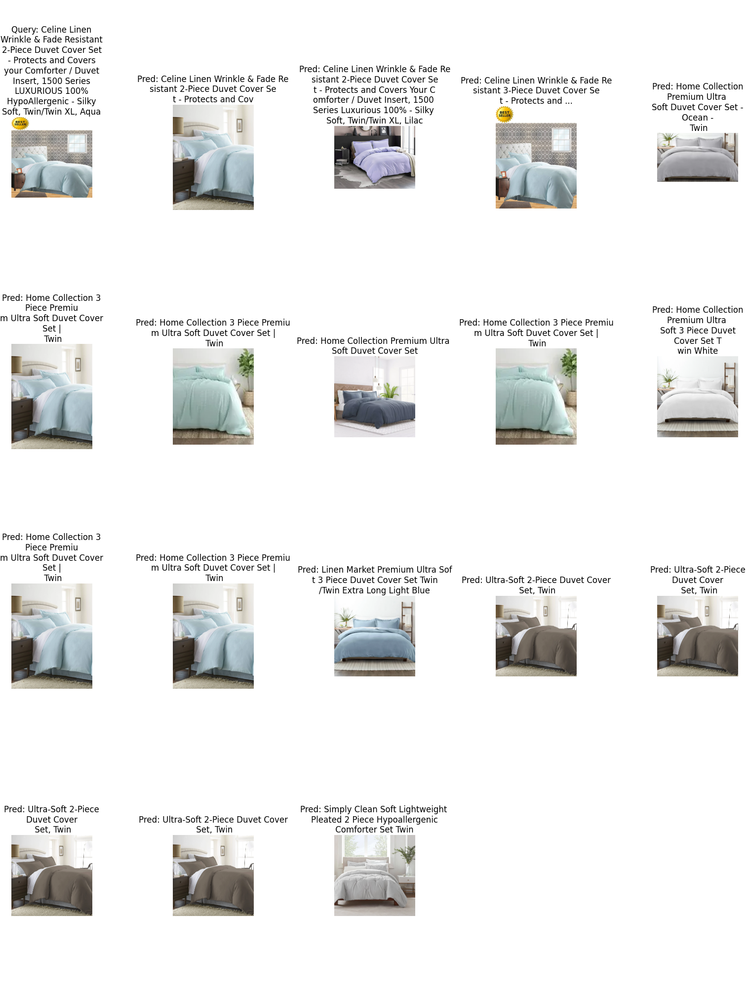

============================================================ 6 ============================================================
labels:


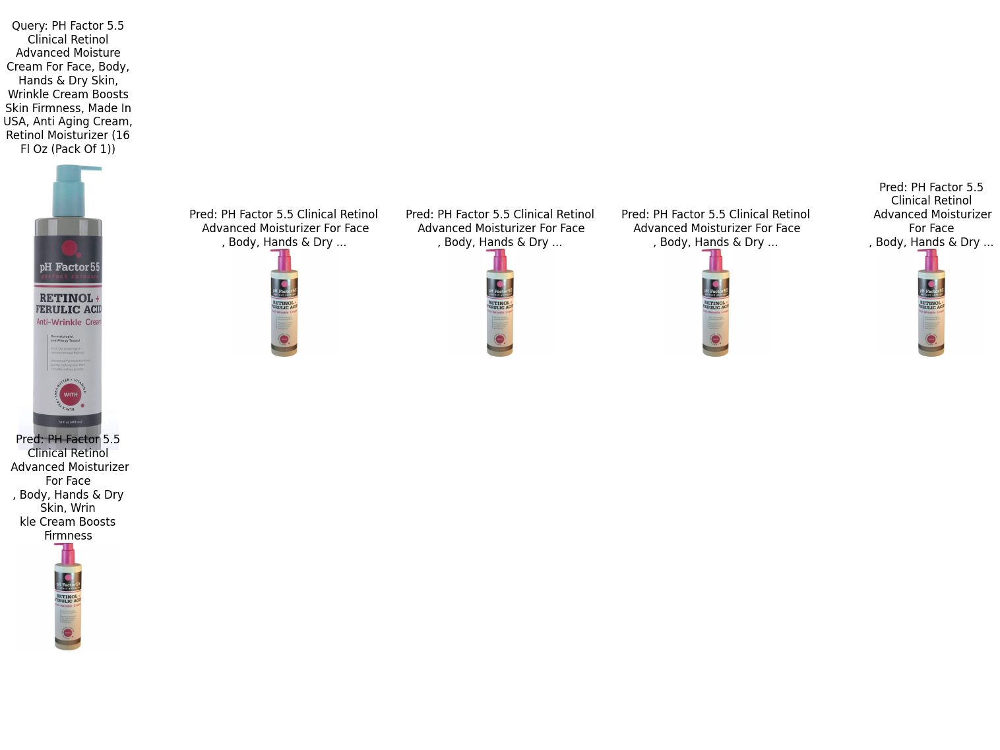

preds:


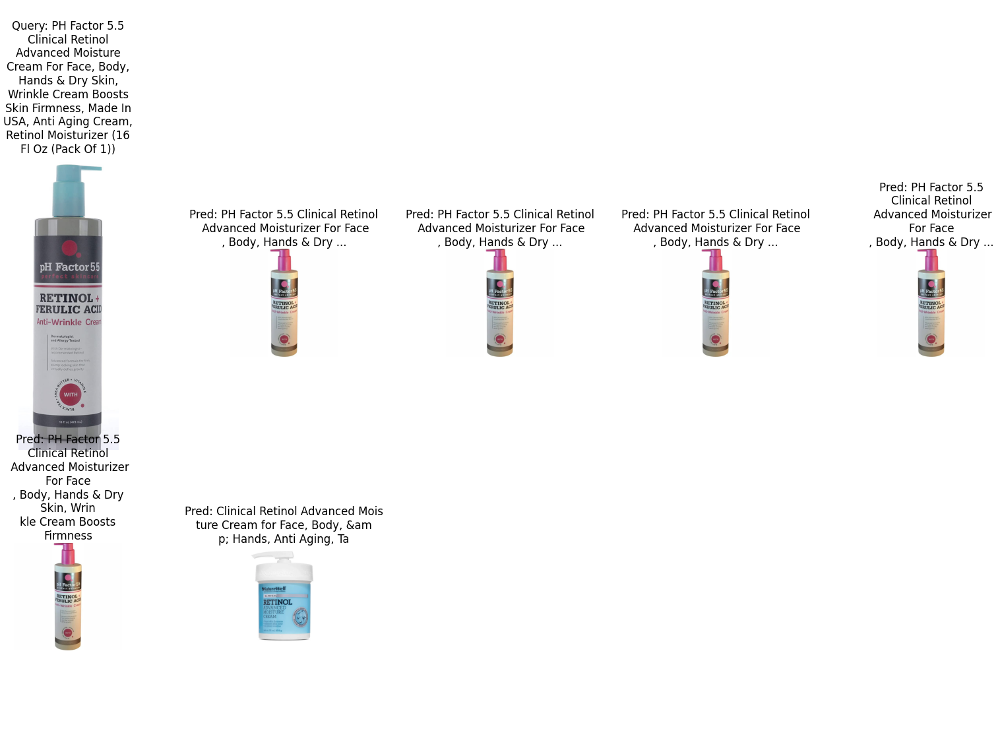

============================================================ 7 ============================================================
labels:


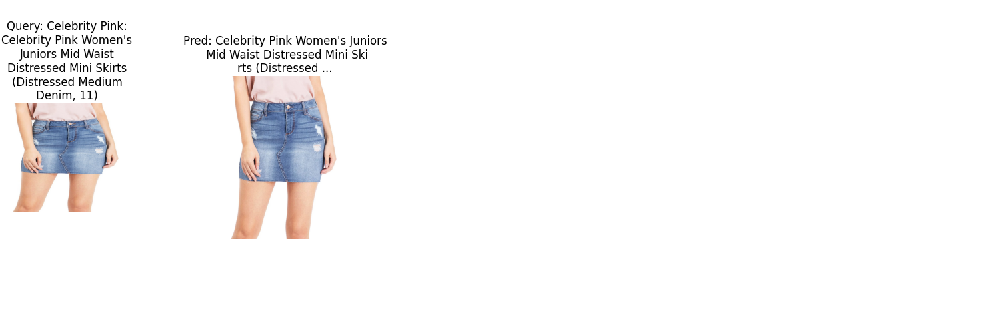

preds:


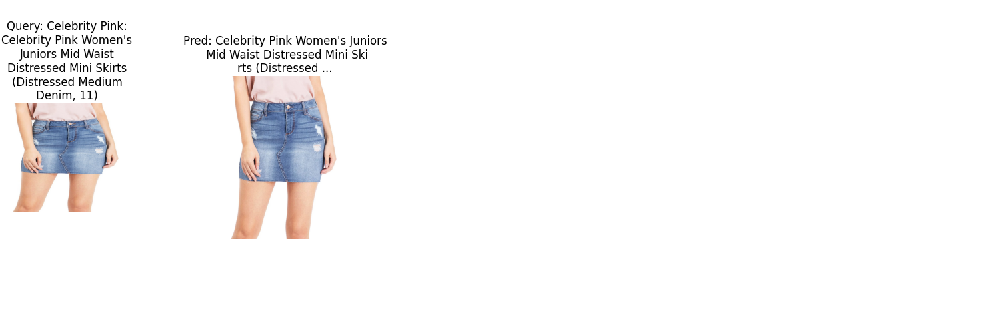

============================================================ 8 ============================================================
labels:


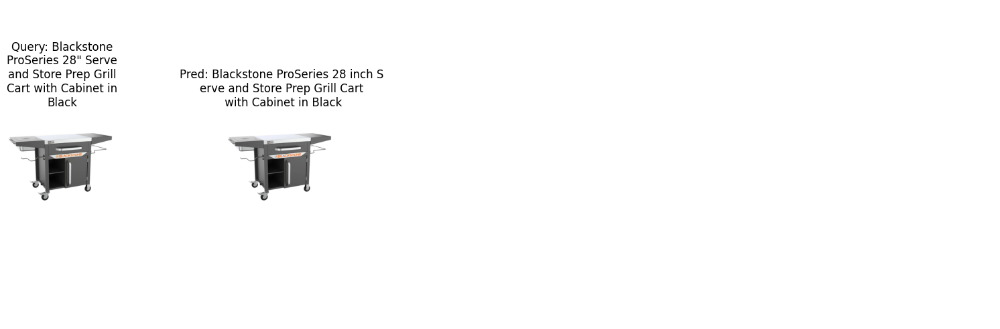

preds:


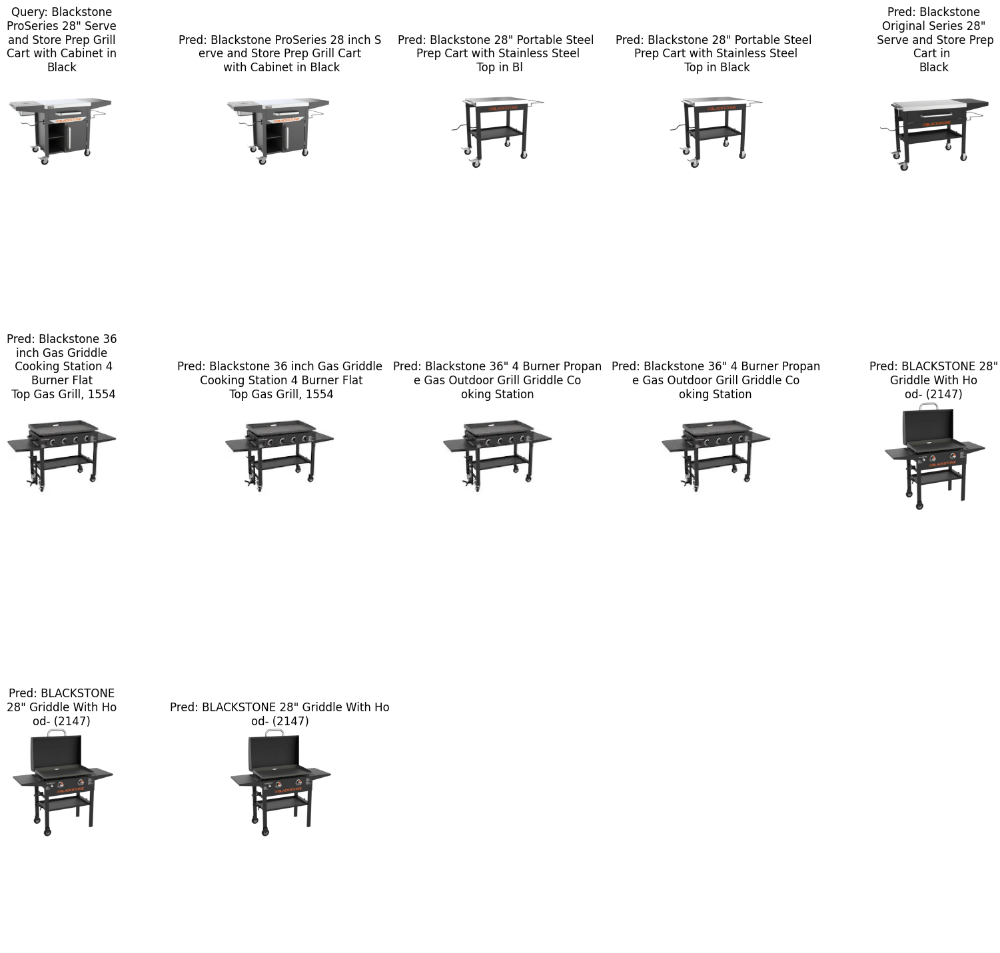

============================================================ 9 ============================================================
labels:


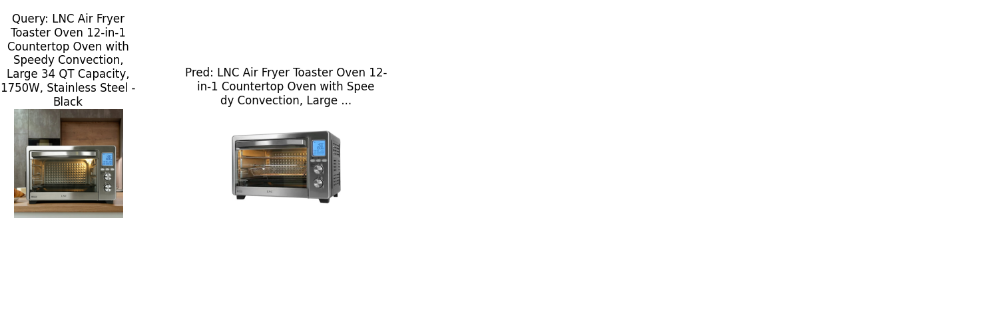

preds:


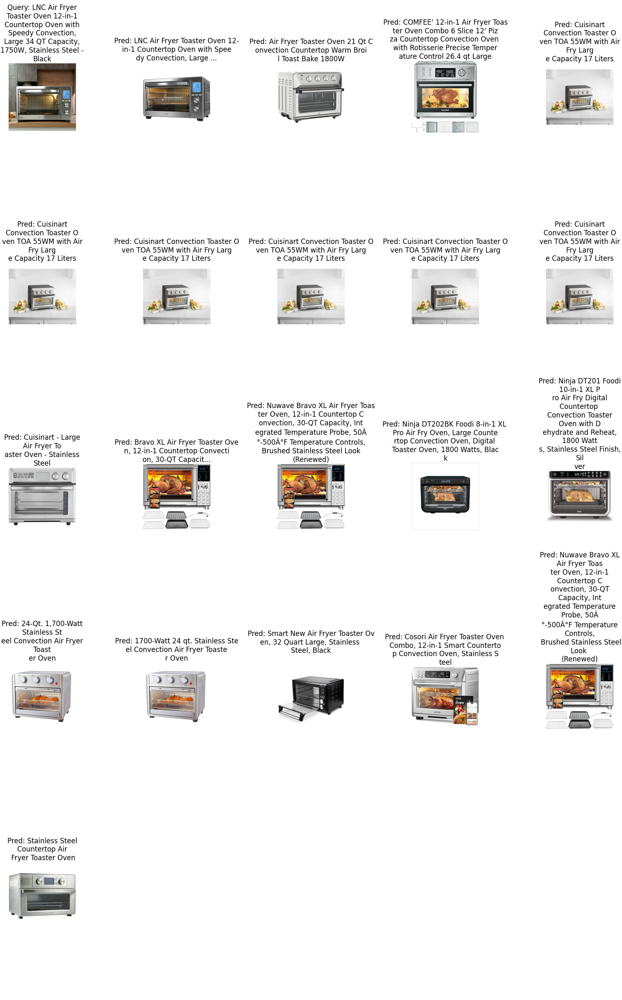

============================================================ 10 ============================================================
labels:


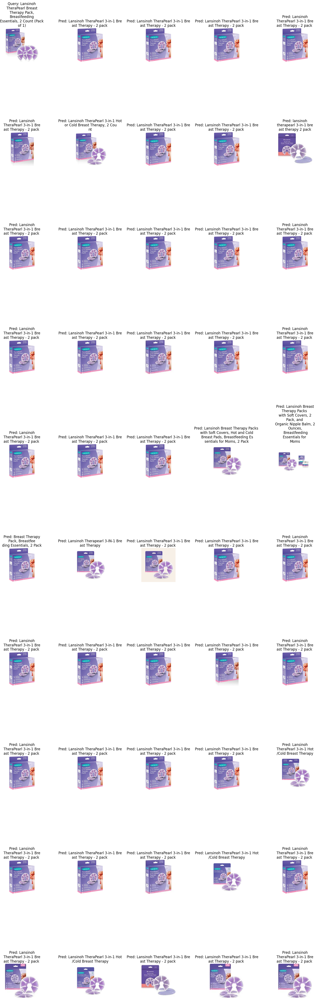

preds:


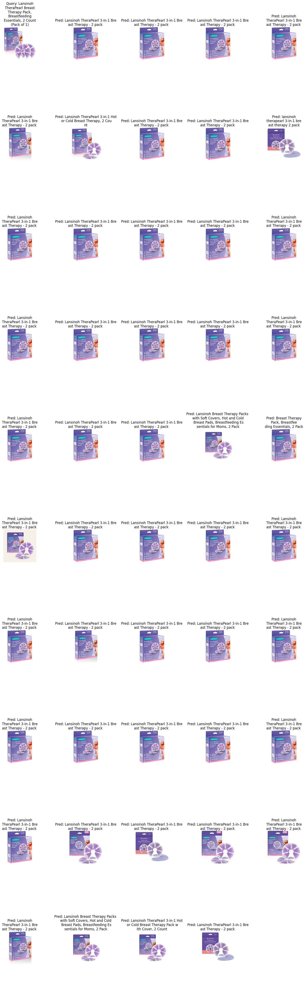

In [6]:
for i, row in eval_df.iterrows():
    query_text = row["title"]
    query_image_path = row["img_path"]
    pred_ids = row["pred"]
    label_ids = row["label"]

    # get pred df
    pred_df = gallery_df[gallery_df["dp-id"].isin(pred_ids)]
    pred_texts = pred_df["title"].tolist()
    pred_image_paths = pred_df["img_path"].tolist()
    pred_ids = pred_df["dp-id"].tolist()

    # get label df
    label_df = gallery_df[gallery_df["dp-id"].isin(label_ids)]
    label_texts = label_df["title"].tolist()
    label_image_paths = label_df["img_path"].tolist()
    label_ids = label_df["dp-id"].tolist()

    # rerank
    reranked_pred_ids = reranker.rerank(
        query_text, pred_texts, query_image_path, pred_image_paths, pred_ids=pred_ids
    )

    # get reranked pred df
    reranked_pred_df = gallery_df[gallery_df["dp-id"].isin(reranked_pred_ids)]
    reranked_pred_texts = reranked_pred_df["title"].tolist()
    reranked_pred_image_paths = reranked_pred_df["img_path"].tolist()
    reranked_pred_ids = reranked_pred_df["dp-id"].tolist()

    print("===" * 20 + f" {i} " + "===" * 20)
    print("labels:")
    visualize(query_text, label_texts, query_image_path, label_image_paths)
    print("preds:")
    visualize(
        query_text, reranked_pred_texts, query_image_path, reranked_pred_image_paths
    )
    if i == 10:
        break